# Pretrained GAN

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='3' 
import fastai
from fastai import *
from fastai.vision import *
from fastai.callbacks import *

from torchvision.models import vgg16_bn

In [2]:
from PIL import Image, ImageDraw, ImageFont

In [3]:
path = untar_data(URLs.PETS)
path_hr = path/'images'
path_lr = path/'crappy'

In [4]:
#torch.cuda.set_device(1)

## Crappified data

Prepare the input data by crappifying images.

In [5]:
def crappify(fn,i):
    dest = path_lr/fn.relative_to(path_hr)
    dest.parent.mkdir(parents=True, exist_ok=True)
    img = PIL.Image.open(fn)
    targ_sz = resize_to(img, 96, use_min=True)
    img = img.resize(targ_sz, resample=PIL.Image.BILINEAR).convert('RGB')
    w,h = img.size
    q = random.randint(10,70)
    ImageDraw.Draw(img).text((random.randint(0,w//2),random.randint(0,h//2)), str(q), fill=(255,255,255))
    img.save(dest, quality=q)

Uncomment the first time you run this notebook.

In [6]:
#il = ImageItemList.from_folder(path_hr)
#parallel(crappify, il.items)

For gradual resizing we can change the commented line here.

In [7]:
bs,size = 24,160
# bs,size = 8,256
arch = models.resnet34

## Pre-train generator

Now let's pretrain the generator.

In [8]:
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).random_split_by_pct(0.1, seed=42)

In [9]:
def get_data(bs,size):
    data = (src.label_from_func(lambda x: path_hr/x.name)
           .transform(get_transforms(max_zoom=2.), size=size, tfm_y=True)
           .databunch(bs=bs).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [10]:
data_gen = get_data(bs,size)

In [11]:
wd = 1e-3

In [12]:
def create_gen_learner():
    return unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Weight,
                         self_attention=True, y_range=(-3.,3.), loss_func=MSELossFlat())

In [13]:
learn_gen = create_gen_learner()

In [ ]:
learn_gen.fit_one_cycle(2, pct_start=0.8)

In [ ]:
learn_gen.unfreeze()

In [ ]:
learn_gen.fit_one_cycle(3, slice(1e-6,1e-3))

In [ ]:
learn_gen.show_results(rows=4)

In [ ]:
learn_gen.save('gen-pre2')

## Save generated images

In [ ]:
learn_gen.load('gen-pre2');

In [14]:
name_gen = 'image_gen'
path_gen = path/name_gen
path_gen.mkdir(exist_ok=True)

In [ ]:
def save_preds(dl):
    i=0
    names = dl.dataset.items
    
    for b in dl:
        preds = learn_gen.pred_batch(batch=b, reconstruct=True)
        for o in preds:
            o.save(path_gen/names[i].name)
            i += 1

In [ ]:
save_preds(data_gen.fix_dl)

In [ ]:
PIL.Image.open(path_gen.ls()[0])

## Train critic

In [15]:
classes = [name_gen, 'images']

In [16]:
src = ImageItemList.from_folder(path, include=classes).random_split_by_pct(0.1, seed=42)
ll = src.label_from_folder(classes=classes)
data_crit = (ll.transform(get_transforms(max_zoom=2.), size=size)
       .databunch(bs=bs).normalize(imagenet_stats))

data_crit.c = 3

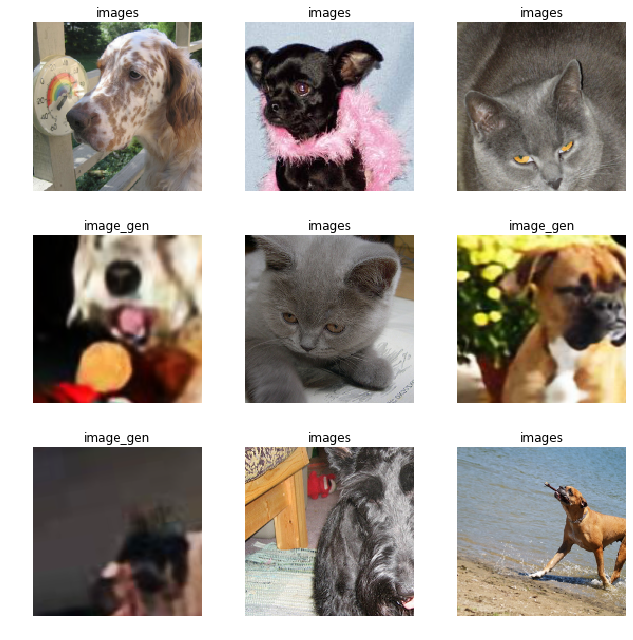

In [17]:
data_crit.show_batch(rows=3, ds_type=DatasetType.Train, imgsize=3)

In [18]:
conv_args = dict(leaky=0.2, norm_type=NormType.Spectral)

def conv(ni:int, nf:int, ks:int=3, stride:int=1, **kwargs):
    return conv_layer(ni, nf, ks=ks, stride=stride, **conv_args, **kwargs)

def critic(n_channels:int=3, nf:int=128, n_blocks:int=3, p:int=0.15):
    layers = [
        conv(n_channels, nf, ks=4, stride=2),
        nn.Dropout2d(p/2),
        res_block(nf, dense=True,**conv_args)]
    nf *= 2 # after dense block
    for i in range(n_blocks):
        layers += [
            nn.Dropout2d(p),
            conv(nf, nf*2, ks=4, stride=2, self_attention=(i==0))]
        nf *= 2
    layers += [
        conv(nf, 1, ks=4, bias=False, padding=0, use_activ=False),
        Flatten()]
    return nn.Sequential(*layers)

Module to apply the loss function to every element of the last features before taking the mean.

In [19]:
class AdaptiveLoss(nn.Module):
    def __init__(self, crit):
        super().__init__()
        self.crit = crit

    def forward(self, output, target):
        return self.crit(output, target[:,None].expand_as(output).float())

Specific accuracy metric.

In [20]:
def accuracy_thresh_expand(y_pred:Tensor, y_true:Tensor, thresh:float=0.5, sigmoid:bool=True)->Rank0Tensor:
    "Compute accuracy when `y_pred` and `y_true` are the same size."
    if sigmoid: y_pred = y_pred.sigmoid()
    return ((y_pred>thresh)==y_true[:,None].expand_as(y_pred).byte()).float().mean()

Pretrain the critic on crappy vs not crappy.

In [21]:
def create_critic_learner(loss_func, metrics):
    return Learner(data_crit, critic(), metrics=metrics, loss_func=loss_func, wd=wd)

In [ ]:
learn_critic = create_critic_learner(metrics=accuracy_thresh_expand, loss_func=AdaptiveLoss(nn.BCEWithLogitsLoss()))

In [ ]:
learn_critic.fit_one_cycle(6, 1e-3)

In [ ]:
learn_critic.fit_one_cycle(6, 1e-3)

In [ ]:
learn_critic.save('critic-pre2')

## GAN

Now we'll combine those pretrained model in a GAN.

In [22]:
from fastai.vision.gan import *

Those are the losses from before.

In [23]:
loss_critic = AdaptiveLoss(nn.BCEWithLogitsLoss())
loss_gen    = MSELossFlat()

In [24]:
learn_crit=None
learn_gen=None
gc.collect()

16814

In [25]:
learn_crit = create_critic_learner(metrics=None, loss_func=AdaptiveLoss(nn.BCEWithLogitsLoss())).load('critic-pre2')

In [26]:
learn_gen = create_gen_learner().load('gen-pre2')

To define a GAN Learner, we just have to specify the learner objects foor the generator and the critic. The switcher is a callback that decides when to switch from discriminator to generator and vice versa. Here we do as many iterations of the discriminator as needed to get its loss back < 0.5 then one iteration of the generator.

The loss of the critic is given by `learn_crit.loss_func`. We take the average of this loss function on the batch of real predictions (target 1) and the batch of fake predicitions (target 0). 

The loss of the generator is weighted sum (weights in `weights_gen`) of `learn_crit.loss_func` on the batch of fake (passed throught the critic to become predictions) with a target of 1, and the `learn_gen.loss_func` applied to the output (batch of fake) and the target (corresponding batch of superres images).

In [27]:
@dataclass
class GANDiscriminativeLR(LearnerCallback):
    "`Callback` that handles multiplying the learning rate by `mult_lr` for the critic."
    mult_lr:float = 5.

    def on_batch_begin(self, train, **kwargs):
        "Multiply the current lr if necessary."
        if not self.learn.gan_trainer.gen_mode and train:
            self.learn.opt.lr *= self.mult_lr

    def on_step_end(self, **kwargs):
        "Put the LR back to its value if necessary."
        if not self.learn.gan_trainer.gen_mode:
            self.learn.opt.lr /= self.mult_lr

In [28]:
switcher = partial(AdaptiveGANSwitcher, critic_thresh=0.65)
#switcher = partial(FixedGANSwitcher, n_crit=1, n_gen=1)
learn = GANLearner.from_learners(learn_gen, learn_crit, weights_gen=(1.,250.), show_img=True, switcher=switcher,
                                 opt_func=partial(optim.Adam, betas=(0.,0.99)), wd=wd)
learn.callback_fns.append(partial(GANDiscriminativeLR, mult_lr=5.))

epoch,train_loss,gen_loss,disc_loss
1,9.038448,7.283575,17.997297


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


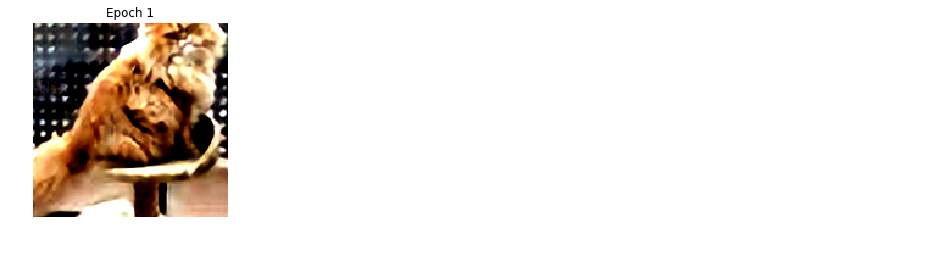

In [29]:
learn.fit(1,4e-5)

epoch,train_loss,gen_loss,disc_loss
1,8.614391,7.169641,16.897020
2,8.427563,7.305515,16.651810
3,8.116353,7.154495,16.141661
4,8.269724,7.196945,16.158195
5,8.118390,7.185439,16.010870
6,8.357467,7.079372,16.385401
7,8.524817,7.070886,16.491701
8,8.176343,6.860698,15.920497
9,8.419917,6.969331,16.347475
10,8.597040,6.785380,16.483841


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


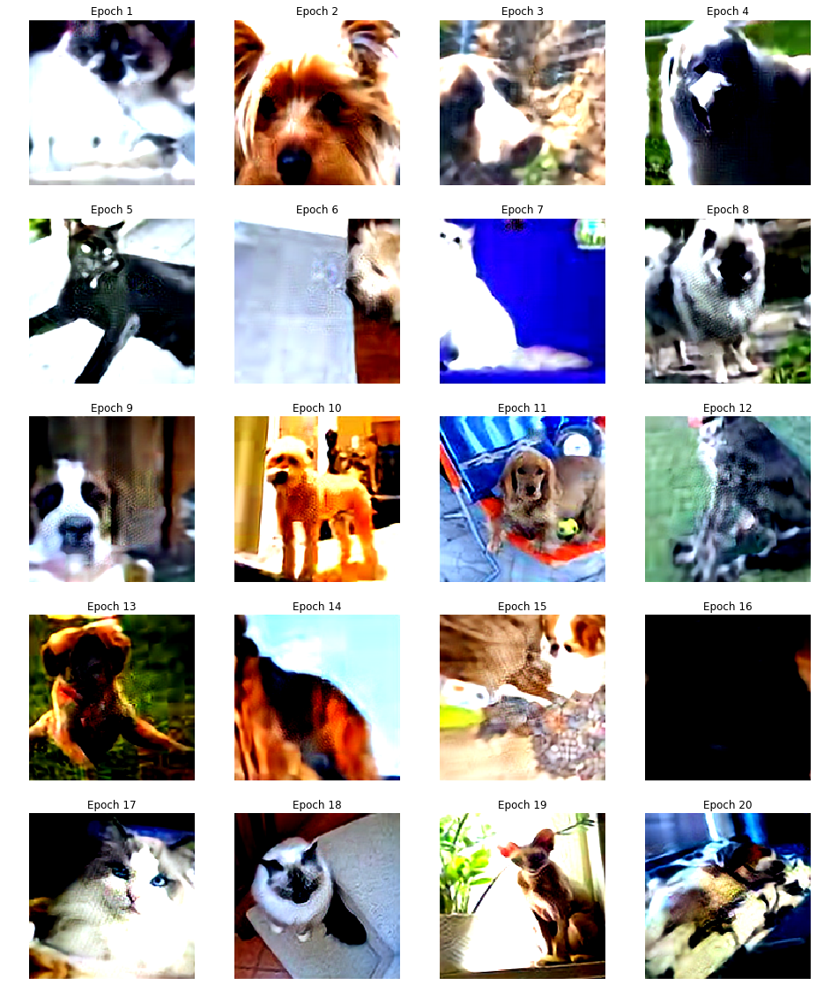

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

In [30]:
learn.fit(20,4e-5)

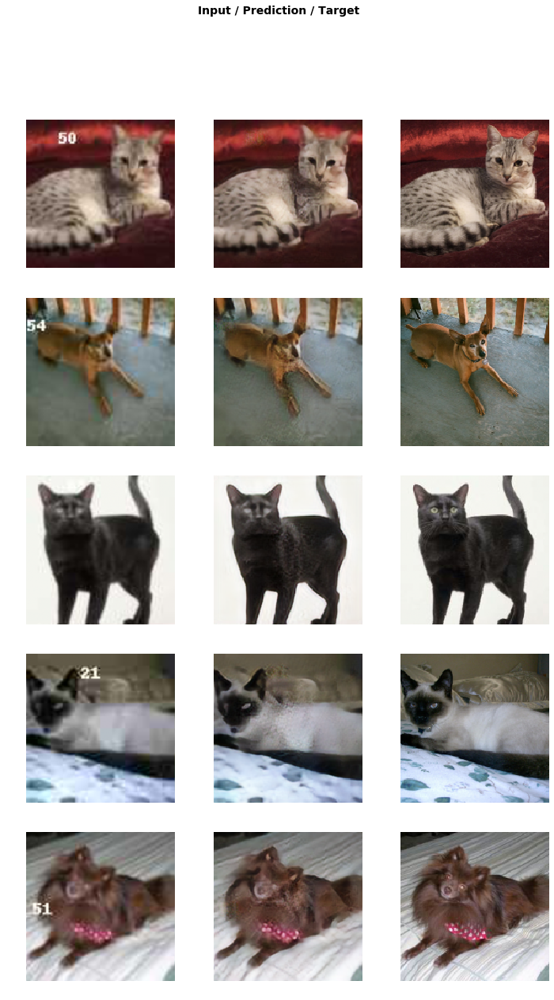

In [31]:
learn.show_results()

epoch,train_loss,gen_loss,disc_loss
1,8.172411,6.943961,16.170137
2,8.542601,6.707341,16.416168
3,8.547094,6.855416,16.452799
4,8.199780,6.802707,16.072176
5,8.393872,6.764167,16.208963
6,8.260240,6.702742,16.019594
7,8.487552,6.834187,16.308348
8,8.043316,7.145705,16.130508
9,8.154036,6.629638,15.896331
10,8.614384,6.949776,16.397079


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


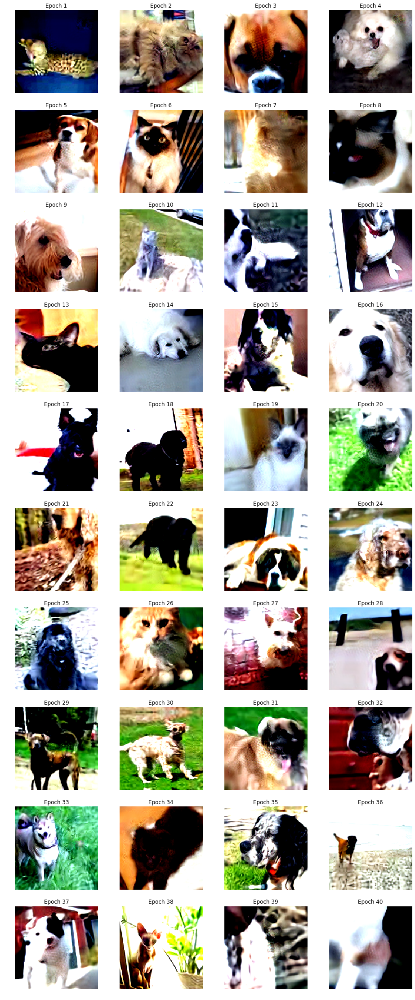

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

In [32]:
learn.fit(40,4e-5)

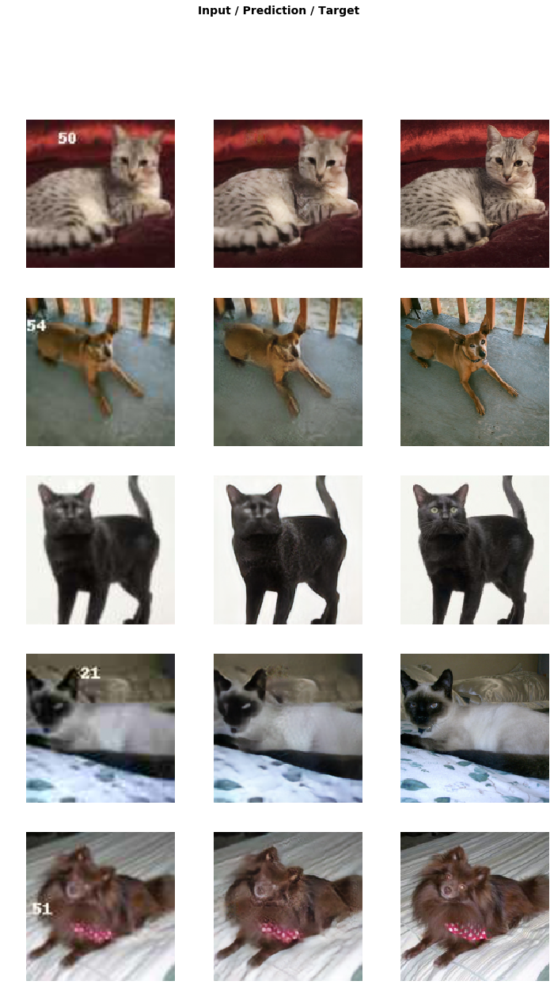

In [33]:
learn.show_results()

epoch,train_loss,gen_loss,disc_loss
1,8.046683,7.080420,15.934920
2,8.170072,7.085170,16.060175
3,7.954448,7.074011,15.901396
4,8.219833,7.160622,16.196573
5,8.124840,7.069705,16.059523
6,8.129525,7.179462,16.030573
7,8.067255,7.087887,15.962467
8,8.385971,7.115053,16.422829
9,7.972328,7.063232,15.911920
10,8.200604,7.011533,16.128185


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


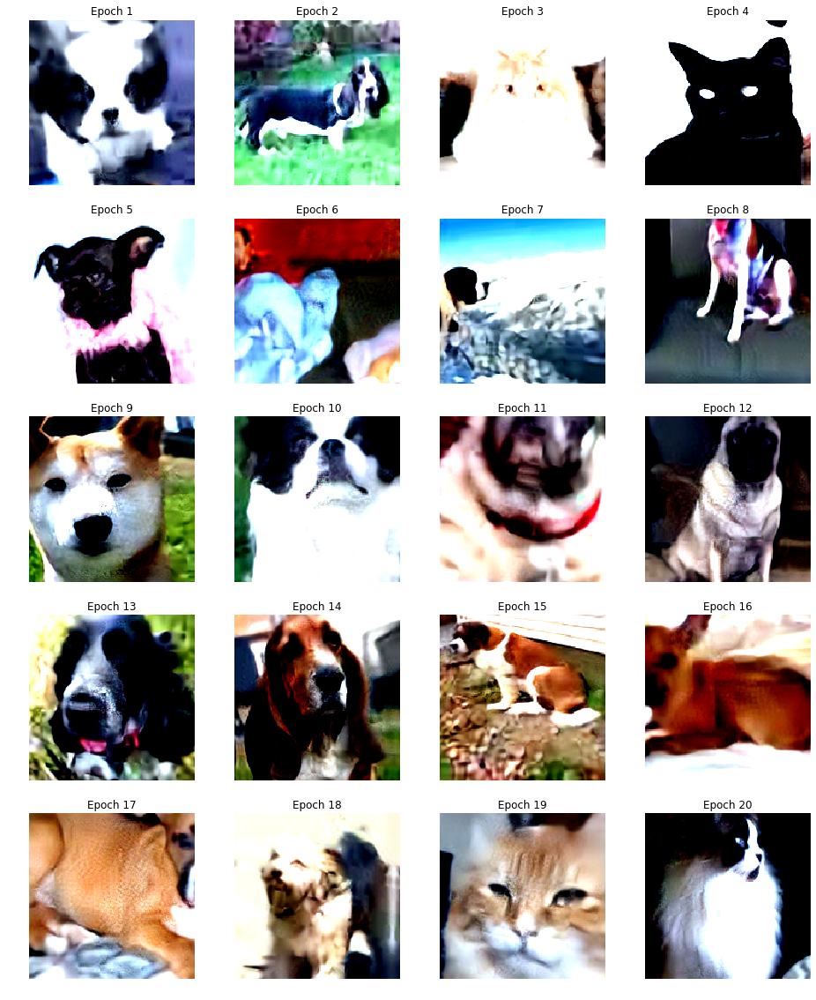

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

In [34]:
learn.fit(20,4e-6)

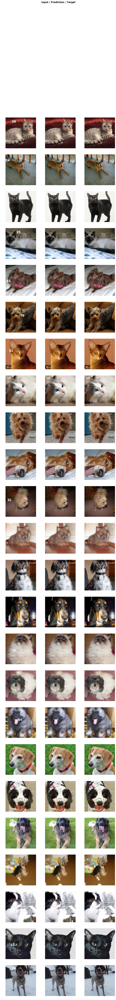

In [39]:
learn.show_results(rows=24)

## fin